## Create complete graphs from VerboseOcarina data (one scene, all rooms, disjoint)

G_actors = MultiDiGraph with 61 nodes and 414 edges
G_spawns = MultiDiGraph with 10 nodes and 14 edges
G_actor_spawns = MultiDiGraph with 71 nodes and 534 edges


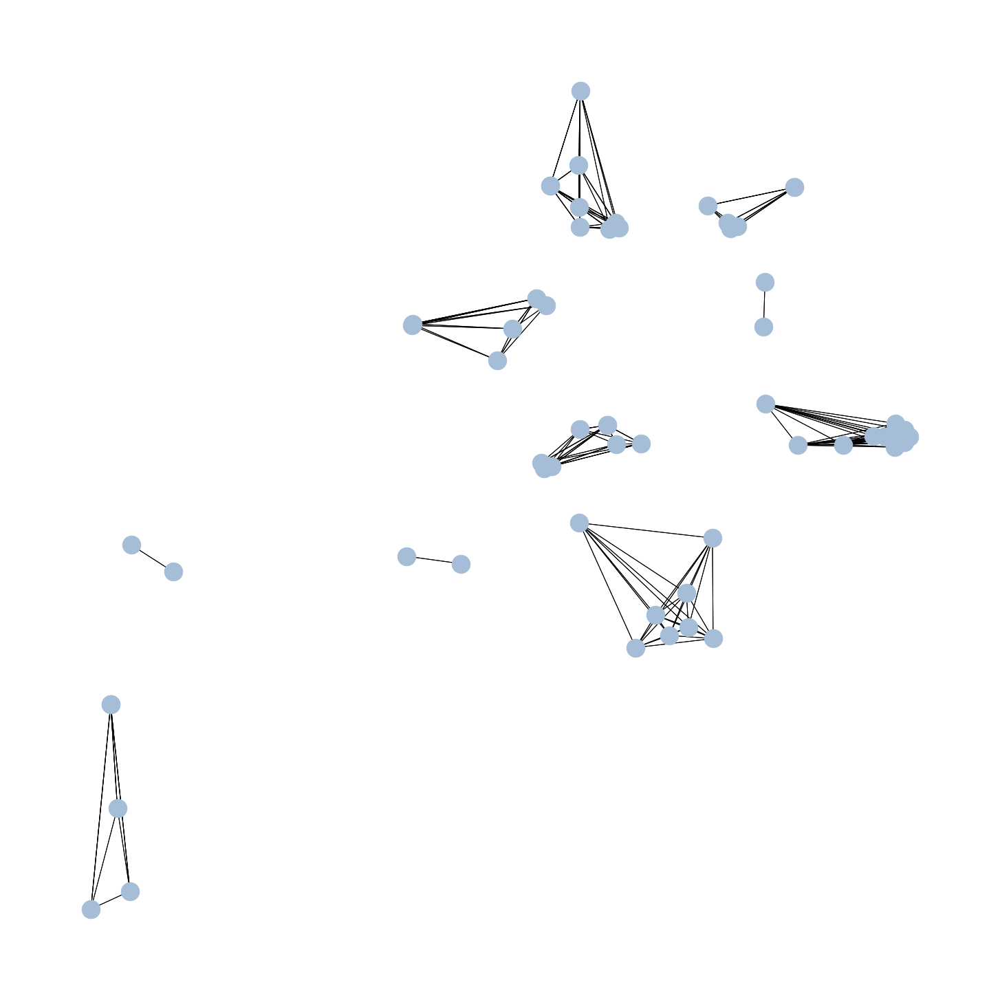

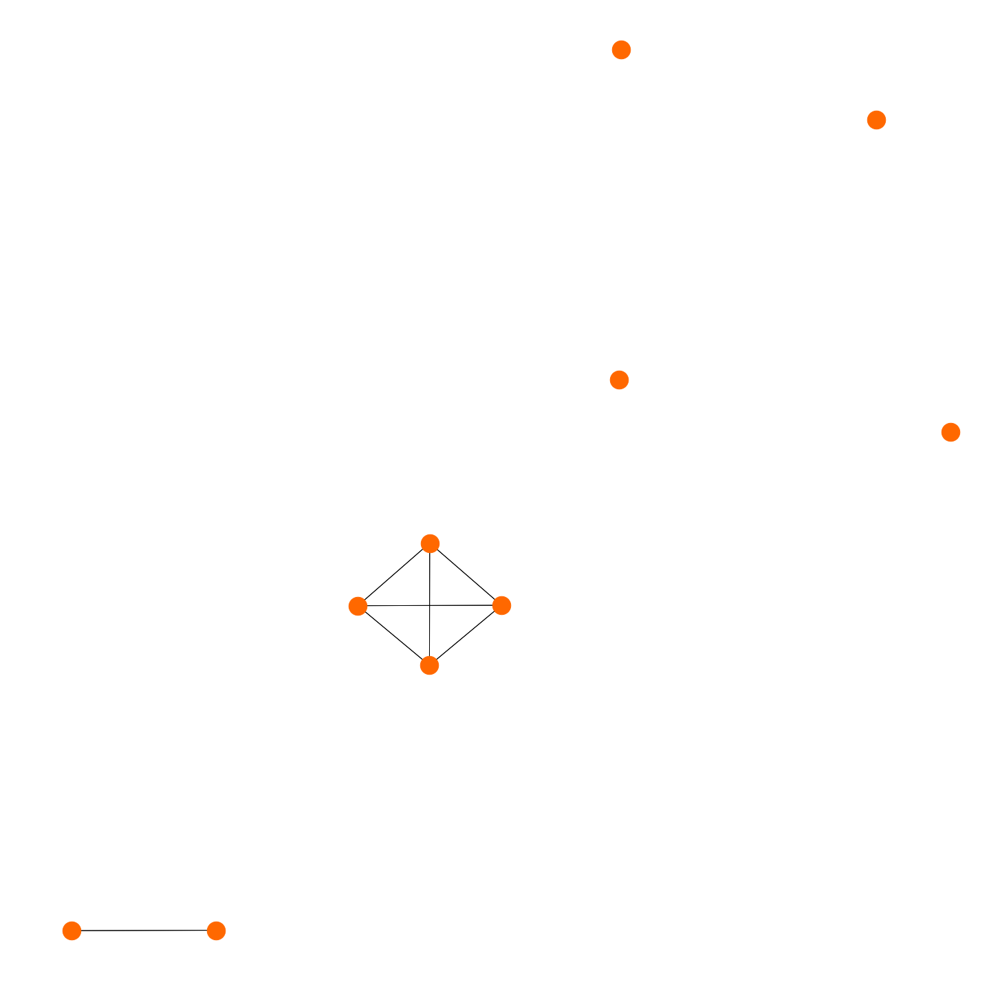

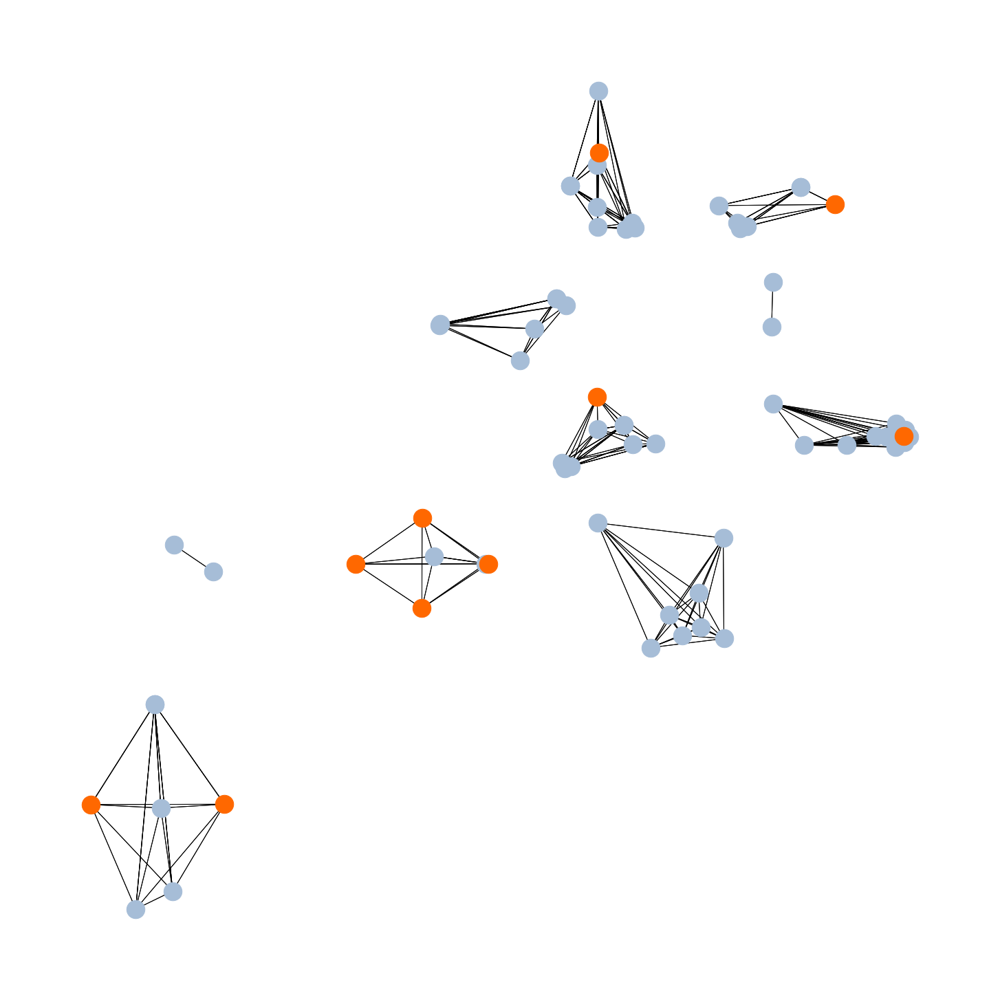

In [19]:
import matplotlib.pyplot as plt
import networkx as nx
import pandas as pd

import oot_graph_builder as ogb

kelly_colors = dict(vivid_yellow='#FFB300',
                    strong_purple='#803E75',
                    vivid_orange='#FF6800',
                    very_light_blue='#A6BDD7',
                    vivid_red='#C10020',
                    grayish_yellow='#CEA262',
                    medium_gray='#817066')

colors = {1: kelly_colors['medium_gray'],
          2: kelly_colors['vivid_yellow'],
          0: kelly_colors['very_light_blue'],
          -1: kelly_colors['vivid_orange'],
          -2: kelly_colors['strong_purple']
          }

canvas_size = 20
font_color = 'gray'
font_size = 20
font_weight = 'bold'

all_actors_df = pd.read_csv("resources/VerboseOcarina/actors.csv", sep=';')
all_transition_actors_df = pd.read_csv("resources/VerboseOcarina/transition_actors.csv", sep=';')
all_spawns_df = pd.read_csv("resources/VerboseOcarina/spawns.csv", sep=';')

scene = 91
is_cutscene = False
setup = 0

G_actors = ogb.build_room_actors_components(all_actors_df, scene, setup, is_cutscene, ogb.ACTOR_LABEL)
scene_actors_pos_dict = ogb.get_pos_dict(all_actors_df, mirrored_over_x_axis=True)

G_spawns = ogb.build_room_actors_components(all_spawns_df, scene, setup, is_cutscene, ogb.SPAWN_LABEL)
scene_spawns_pos_dict = ogb.get_pos_dict(all_spawns_df, mirrored_over_x_axis=True)

print(f"{G_actors = !s}")
plt.figure(figsize=(canvas_size, canvas_size))
nx.draw(G_actors,
        scene_actors_pos_dict,
        arrows=False,
        # with_labels=True,
        # labels={k: v.split(',')[0] for k, v in G_actors.nodes(data='description')},
        # font_color=font_color,
        # font_size=font_size,
        node_size = 700,
        node_color=kelly_colors['very_light_blue']
        )
# plt.savefig(f"output/graph_s{scene}_{'cutscene_' if is_cutscene else ''}setup{setup}_actors.pdf")

print(f"{G_spawns = !s}")
plt.figure(figsize=(canvas_size, canvas_size))
nx.draw(G_spawns,
        scene_spawns_pos_dict,
        arrows=False,
        # with_labels=True,
        # labels={k: v.split(',')[0] for k, v in G_spawns.nodes(data='description')},
        # font_color=font_color,
        # font_size=font_size,
        node_size = 700,
        node_color=kelly_colors['vivid_orange']
        )
# plt.savefig(f"output/graph_s{scene}_{'cutscene_' if is_cutscene else ''}setup{setup}_spawns.pdf")

G_actor_spawns = ogb.union_spawns_and_actors(G_spawns, G_actors, ('s-', ''))
G_actor_spawns_pos_dict = ogb.get_pos_dict(G_actor_spawns, True)

nodedict = {}
nodedict['actors'] = [n
                      for n, t in G_actor_spawns.nodes(data=ogb.NODE_TYPE_LABEL, default='')
                      if t == ogb.ACTOR_LABEL]
nodedict['spawns'] = [n
                      for n, t in G_actor_spawns.nodes(data=ogb.NODE_TYPE_LABEL, default='')
                      if t == ogb.SPAWN_LABEL]

print(f"{G_actor_spawns = !s}")
plt.figure(figsize=(canvas_size, canvas_size))
nx.draw(G_actor_spawns,
        G_actor_spawns_pos_dict,
        arrows=False,
        )
nx.draw_networkx_nodes(G_actor_spawns,
                       G_actor_spawns_pos_dict,
                       nodelist=nodedict['actors'],
                       node_size = 700,
                       node_color=kelly_colors['very_light_blue'],
                       )
nx.draw_networkx_nodes(G_actor_spawns,
                       G_actor_spawns_pos_dict,
                       nodelist=nodedict['spawns'],
                       node_size = 700,
                       node_color=kelly_colors['vivid_orange'],
                       )
# plt.savefig(f"output/graph_s{scene}_{'cutscene_' if is_cutscene else ''}setup{setup}_actors_spawns.pdf")


## Add transition actors

G_transit = MultiDiGraph with 9 nodes and 18 edges


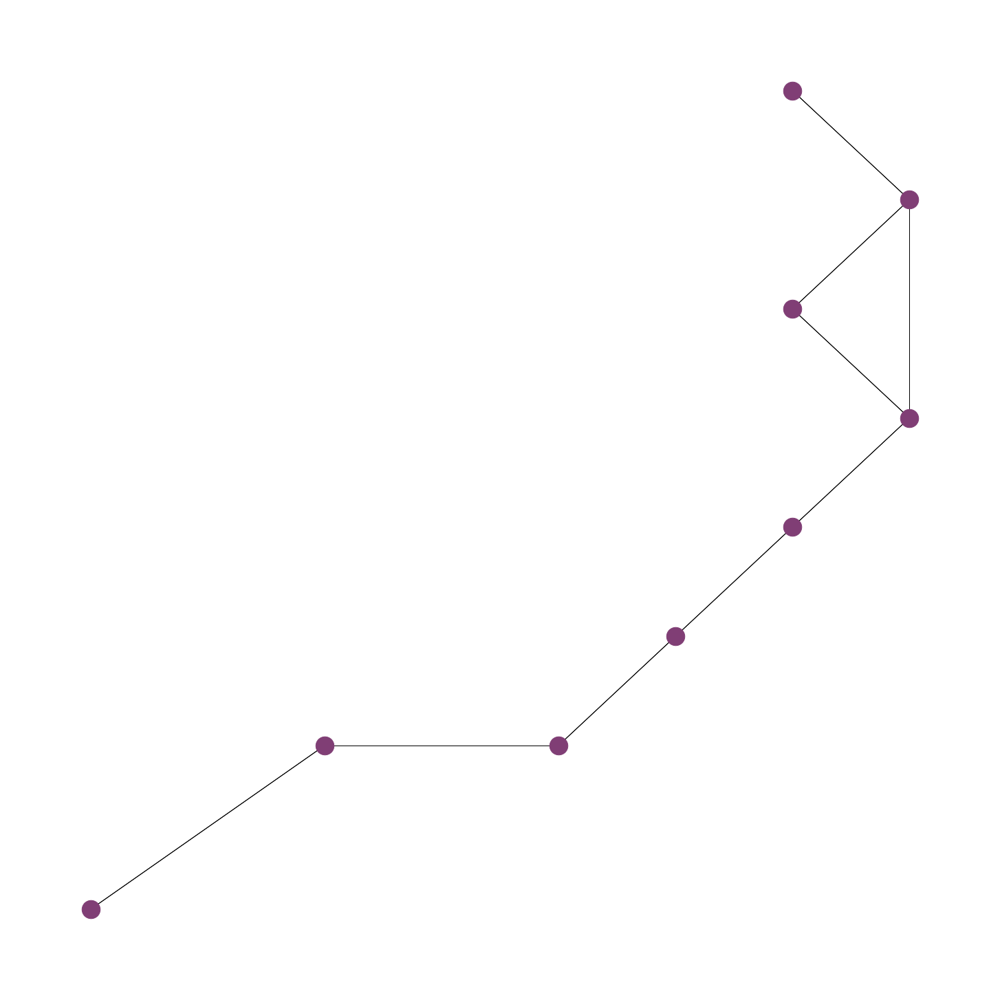

In [20]:
G_transit = ogb.build_transition_actors(all_transition_actors_df, scene, setup, is_cutscene)
scene_transit_pos_dict = ogb.get_pos_dict(all_transition_actors_df, mirrored_over_x_axis=True)

print(f"{G_transit = !s}")
plt.figure(figsize=(canvas_size, canvas_size))
nx.draw(G_transit,
        scene_transit_pos_dict,
        arrows=False,
        # with_labels=True,
        # font_color=font_color,
        # font_size=font_size,
        node_size = 700,
        node_color=kelly_colors['strong_purple']
        )

# plt.savefig(f"output/graph_s{scene}_{'cutscene_' if is_cutscene else ''}setup{setup}_transit.pdf")


## Graph union & connect transitions with rooms

G_scene = MultiDiGraph with 80 nodes and 792 edges


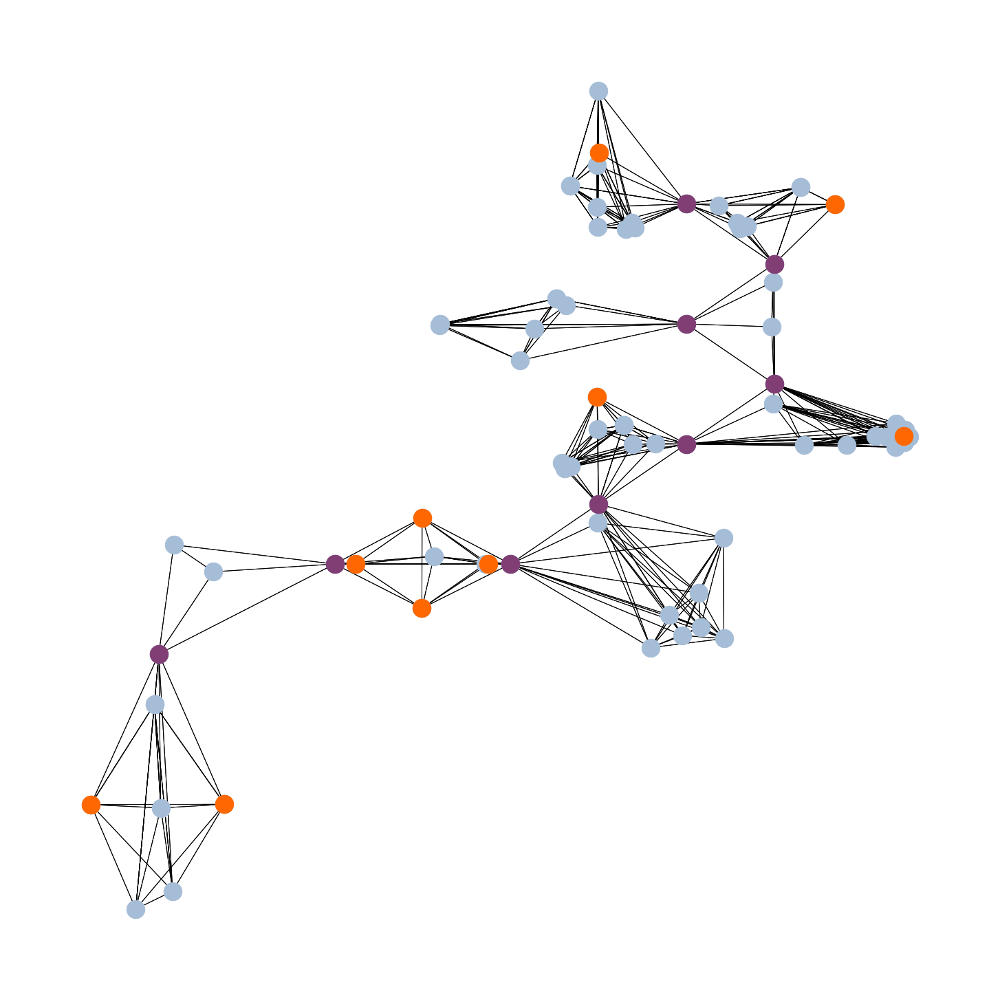

In [21]:
transit_prefix = 't-'

G_scene = ogb.union_actors_and_transition_actors(G_actor_spawns,
                                                 G_transit,
                                                 connect_transition_actors=True,
                                                 node_rename=('', transit_prefix))
pos_dict = ogb.get_pos_dict(G_scene, mirrored_over_x_axis=True)
# nx.set_node_attributes(G_scene, {k: ogb.get_telling_unique_node_label(v) for k, v in G_scene.nodes(data=True)}, 'label')
# label_dict = {k: v for k, v in G_scene.nodes(data='label')}

# G_scene = ogb.add_death_warps(G_scene)

print(f"{G_scene = !s}")
if (wcc := nx.number_weakly_connected_components(G_scene)) != 1:
    print(f"Number of connected components: {wcc} != 1")

plt.figure(figsize=(canvas_size, canvas_size))
# nx.draw(G_scene, pos_dict,
#         arrows=False,
#         with_labels=True,
#         # labels=label_dict,
#         font_color=font_color,
#         font_size=font_size,
#         )


nodedict = {}
nodedict['transit'] = [n
                      for n, t in G_scene.nodes(data=ogb.NODE_TYPE_LABEL, default='')
                      if t == ogb.TRANSITION_ACTOR_LABEL]
nodedict['spawns'] = [n
                      for n, t in G_scene.nodes(data=ogb.NODE_TYPE_LABEL, default='')
                      if t == ogb.SPAWN_LABEL]
nx.draw(G_scene,
        pos_dict,
        arrows=False,
        node_size = 700,
        node_color=kelly_colors['very_light_blue']
        )
nx.draw_networkx_nodes(G_scene,
                       pos_dict,
                       nodelist=nodedict['transit'],
                       node_size = 700,
                       node_color=kelly_colors['strong_purple'],
                       )
nx.draw_networkx_nodes(G_scene,
                       pos_dict,
                       nodelist=nodedict['spawns'],
                       node_size = 700,
                       node_color=kelly_colors['vivid_orange'],
                       )

# plt.savefig(f"output/graph_s{scene}_{'cutscene_' if is_cutscene else ''}setup{setup}_all.pdf")


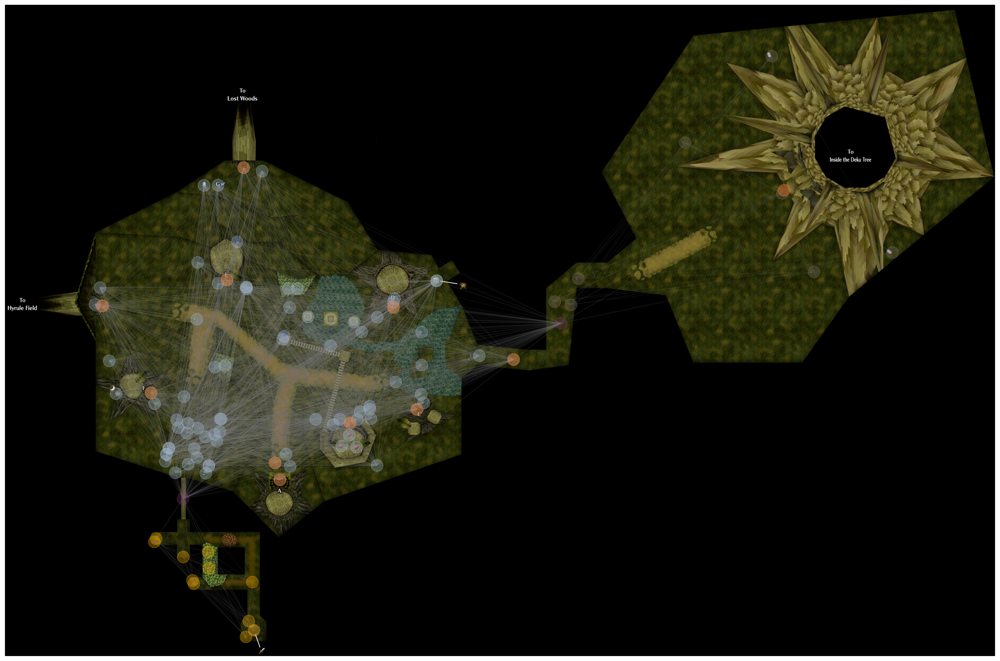

In [90]:

nodedict = {room: [n for n, r in G_scene.nodes(data='room', default=-1) if r == room]
            for room in colors}
# nodedict = {}
nodedict[-1] = [n for n, t in G_scene.nodes(data=ogb.NODE_TYPE_LABEL, default='') if t == ogb.SPAWN_LABEL]
nodedict[-2] = [n for n, r in G_scene.nodes(data='room', default='transition') if r == 'transition']

# pos_dict = nx.spring_layout(G_scene)

minx = min([x for x, _ in pos_dict.values()])
miny = min([y for _, y in pos_dict.values()])
maxx = max([x for x, _ in pos_dict.values()])
maxy = max([y for _, y in pos_dict.values()])

s85setup0_nodes_to_remove = [
    '4844',  # 4844,003B:0001,Ambient Sound Effects, Sound: Stream,,398,-29,-483,0,0,0,85,0,0,False,0
    '4851',  # 4851,0097:0000,Environmental Effects, Flying Fairies, Dustmotes,,355,1,-150,0,0,0,85,0,0,False,7
    '5057',  #,0097:0000,Environmental Effects, Flying Fairies, Dustmotes,,3409,-143,-818,0,0,0,85,1,0,False,0

    '4897',
    # Dummy Signpost in Room 0
    # 4897,0141:0340,Square Signpost, Message ID: 0340,,-784,120,1675,0,32768,0,85,0,0,False,53

    '5146',
    # Dummy Bush in Room 2
    # 5146,0125:FF00,Single Bush/Grass, Normal shrub. Random drops., Spawns set of 3 bugs: False, Random Drop Table: No Table,,-757,120,708,0,0,0,85,2,0,False,9

    's-463',
    # Wierd Spawn on top of Link's house
    # 85,False,0,0,7,0000:0DFF,"Link, Spawn Type: Stand, Camera Initial Focus: No Special Positioning,",-40,344,1244,0,26396,0
]

G_scene.remove_nodes_from(s85setup0_nodes_to_remove)

# import matplotlib as mpl
# mpl.rcParams['figure.dpi']= 300

plt.figure(figsize=(canvas_size, canvas_size))
img = plt.imread("resources/images/Forest_map.png")

nx.draw(G_scene,
        pos=pos_dict,
        arrows=False,
        node_size=0,
        edge_color='gray',
        alpha=0.05
        )
for r, n in nodedict.items():
    nx.draw_networkx_nodes(G_scene,
                           pos_dict,
                           nodelist=n,
                           node_color=colors[r],
                           # node_size=500,
                           alpha=0.3
                           )
ax = plt.gca()
ax.imshow(img, extent=[minx - 700, maxx + 800, miny - 150, maxy + 400])

# plt.savefig(f"output/graph_s{scene}_{'cutscene_' if is_cutscene else ''}setup{setup}_with_map.pdf", dpi=300)